In [1]:
import sys
sys.path.append('../')

import numpy as np
import random
import pickle
import torch
import gpytorch
from gp_mjo.gp_mjo_model import gp_mjo
from gp_mjo.utils.dat_ops import dics_divide

from prettytable import PrettyTable
from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.markers import MarkerStyle

from colorama import Fore, Back, Style

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
npzfile = np.load('../data/mjo_new_data.npz', allow_pickle=True)

## Divide new_datas into four seasons
npz_month = npzfile['month']
winter_ids = np.where( (npz_month==12) | (npz_month==1) | (npz_month==2) )[0]
spring_ids = np.where( (npz_month==3) | (npz_month==4) | (npz_month==5) )[0]
summer_ids = np.where( (npz_month==6) | (npz_month==7) | (npz_month==8) )[0]
fall_ids = np.where( (npz_month==9) | (npz_month==10) | (npz_month==11) )[0]

print(npz_month.shape)
print(winter_ids.shape)
print(spring_ids.shape)
print(summer_ids.shape)
print(fall_ids.shape)

(16026,)
(3940,)
(4048,)
(4048,)
(3990,)


In [3]:
seasons = ['winter','spring','summer','fall']
seasons_ids = [winter_ids, spring_ids, summer_ids, fall_ids]
data_names = npzfile.files + ['id']
n_files = len(data_names)

season_datas = {}
for j in range(4):
    season = seasons[j]
    season_id = seasons_ids[j]

    new_datas = [0]*n_files
    for i in range(n_files):
        if i < n_files-1:
            new_datas[i] = npzfile[data_names[i]][season_id]
        if i == n_files-1:
            new_datas[i] = seasons_ids[j]

    season_datas[season] = new_datas

#example
season_datas['winter']

[array([1979, 1979, 1979, ..., 2022, 2022, 2022]),
 array([1, 1, 1, ..., 2, 2, 2]),
 array([ 1,  2,  3, ..., 26, 27, 28]),
 array([ 0.142507  , -0.2042    , -0.15861   , ...,  0.28864297,
         0.42139462,  0.28795415]),
 array([ 1.05047   ,  1.37361   ,  1.53943   , ..., -0.29837567,
        -0.13990659, -0.09597149]),
 array([6., 7., 7., ..., 3., 4., 4.]),
 array([1.0600899 , 1.3887    , 1.54758   , ..., 0.41514191, 0.4440127 ,
        0.30352613]),
 array([    0,     1,     2, ..., 15762, 15763, 15764])]

In [4]:
print(season_datas['winter'][0].shape)
print(season_datas['winter'][-1].shape)
print(winter_ids.shape)
print(data_names)

(3940,)
(3940,)
(3940,)
['year', 'month', 'day', 'RMM1', 'RMM2', 'phase', 'amplitude', 'id']


In [5]:
## Set initial values
widths = [10, 15, 25]
n_iter = 200
sigma_eps = 0.01
fixed_noise = False

Ns = [len(winter_ids),len(spring_ids),len(summer_ids),len(fall_ids)]# the total number of days in new dataset
n = 2000 # the number of days for training
c = 365 # the number of dropped buffer set
ms = [N-n-c for N in Ns] # the number of days for testing


n_cv = 1 # the number of operations for cross-validation
n1s  = [random.randint(0,n) for i in range(n_cv)]
n1s = [865]

## Set the kernel of GP
nu = 0.5 # 1.5,2.5.... smoothness parameter of Matern kernel
d = 1 # d = width or d = 1
kernel = gpytorch.kernels.MaternKernel(nu=nu, ard_num_dims=d) 

In [6]:
print(ms)
max_lead_time = [m + 1 - max(widths) for m in ms]
print(max_lead_time)

[1575, 1683, 1683, 1625]
[1551, 1659, 1659, 1601]


In [7]:
lead_time = 60
n_pred = 100 # 14*365
# width + lead_time + n_pred-1 <= m

## $Mat\acute{e}rn$ $1/2$

### Independent RMMs with $Mat\acute{e}rn$ $1/2$

In [8]:
# Independent
dics_total_matern12 = {}
cor_total_matern12 = {}
rmse_total_matern12 = {}
phase_err_total_matern12 = {}
amplitude_err_total_matern12 = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscale"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_matern12[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            for data_name in ['RMM1','RMM2']:
                mjo_model.train_mjo(data_name=data_name, season=True, suppress=True)
                mjo_model.pred_mjo(data_name=data_name, lead_time=lead_time, n_pred=n_pred, season=True, suppress=True)
                t.add_rows( [[f'{season}', f'{width}', f'{data_name}', f'{mjo_model.model.covar_module.base_kernel.lengthscale.detach().numpy()[0]}']] )
                
            
            # compute errors
            #mjo_model.obs_extract()
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_matern12[season] = cor_n1
    rmse_total_matern12[season] = rmse_n1
    phase_err_total_matern12[season] = phase_err_n1
    amplitude_err_total_matern12[season] = amplitude_err_n1

matern12_independ = {'cor': cor_total_matern12, 'rmse': rmse_total_matern12, 
                     'phase': phase_err_total_matern12, 'amplitude': amplitude_err_total_matern12,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/matern12_independ.pkl','wb')
pickle.dump(matern12_independ, dic_pkl)

print(f'Matern 1/2 with independent RMMs:')
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:
Matern 1/2 with independent RMMs:
+--------+-------+------+-------------+
| season | width | RMMs | lengthscale |
+--------+-------+------+-------------+
| winter |   10  | RMM1 | [6.9851327] |
| winter |   10  | RMM2 | [17.950914] |
| winter |   15  | RMM1 | [31.616562] |
| winter |   15  | RMM2 |  [41.60129] |
| winter |   25  | RMM1 | [52.447926] |
| winter |   25  | RMM2 |  [60.25939] |
| spring |   10  | RMM1 |  [59.71825] |
| spring |   10  | RMM2 | [59.870487] |
| spring |   15  | RMM1 |  [63.68137] |
| spring |   15  | RMM2 |  [66.34261] |
| spring |   25  | RMM1 |  [72.7966]  |
| spring |   25  | RMM2 |  [77.93628] |
| summer |   10  | RMM1 |  [73.44798] |
| summer |   10  | RMM2 |  [70.23645] |
| summer |   15  | RMM1 |  [70.77969] |
| summer |   15  | RMM2 | [71.158714] |
| summer |   25  | RMM1 |  [76.17213] |
| summer

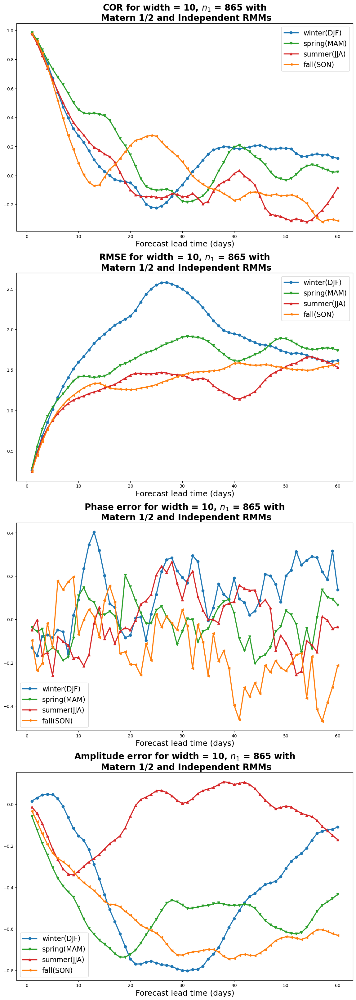

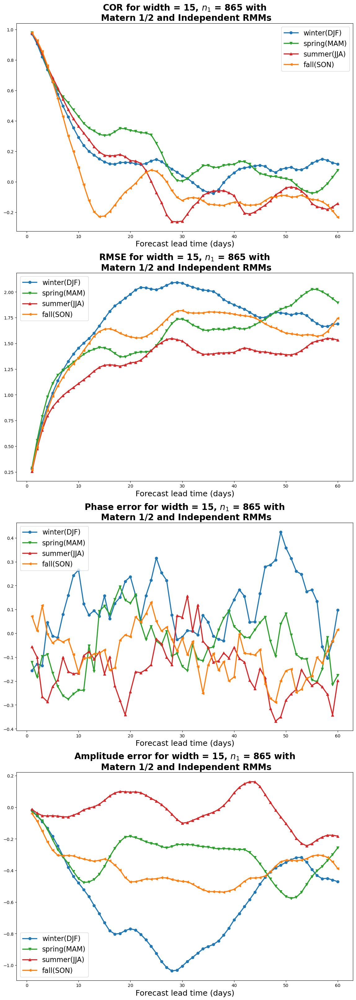

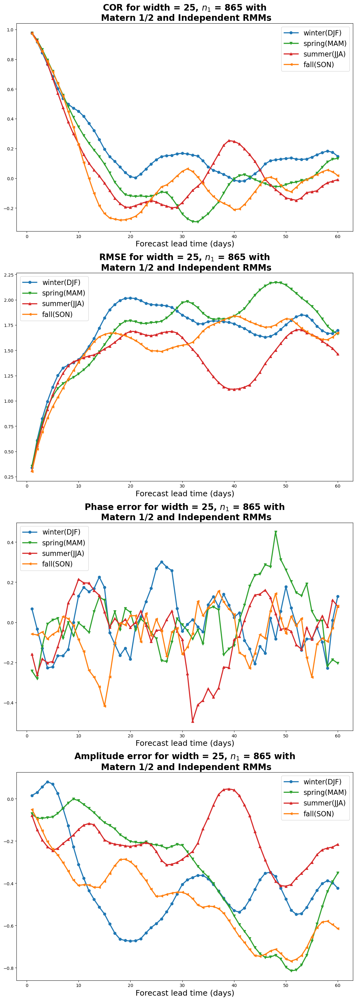

In [9]:
load_file = open('../data/preds/season/matern12_independ.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Matern 1/2 and Independent RMMs', fontsize=20, fontweight="bold")

### Dependent RMMs with $Mat\acute{e}rn$ $1/2$

In [10]:
# Dependent
dics_total_dependmatern12 = {}
cor_total_dependmatern12 = {}
rmse_total_dependmatern12 = {}
phase_err_total_dependmatern12 = {}
amplitude_err_total_dependmatern12 = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscale"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_dependmatern12[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            mjo_model.train_mjo(Depend=True,season=True)
            for data_name in ['RMM1','RMM2']:    
                mjo_model.pred_mjo(data_name=data_name, lead_time=lead_time, n_pred=n_pred, season=True)
            t.add_rows( [[f'{season}', f'{width}', 'dependent', f'{mjo_model.model.covar_module.base_kernel.lengthscale.detach().numpy()[0]}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_dependmatern12[season] = cor_n1
    rmse_total_dependmatern12[season] = rmse_n1
    phase_err_total_dependmatern12[season] = phase_err_n1
    amplitude_err_total_dependmatern12[season] = amplitude_err_n1

matern12_depend = {'cor': cor_total_dependmatern12, 'rmse': rmse_total_dependmatern12, 
                     'phase': phase_err_total_dependmatern12, 'amplitude': amplitude_err_total_dependmatern12,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/matern12_depend.pkl','wb')
pickle.dump(matern12_depend, dic_pkl)

print(f'Matern 1/2 with dependent RMMs:')
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:
Matern 1/2 with dependent RMMs:
+--------+-------+-----------+-------------+
| season | width |    RMMs   | lengthscale |
+--------+-------+-----------+-------------+
| winter |   10  | dependent |  [81.43105] |
| winter |   15  | dependent | [81.266556] |
| winter |   25  | dependent |  [83.47509] |
| spring |   10  | dependent |  [82.95459] |
| spring |   15  | dependent |  [83.39278] |
| spring |   25  | dependent |  [86.95368] |
| summer |   10  | dependent |  [86.13382] |
| summer |   15  | dependent |  [86.2538]  |
| summer |   25  | dependent |   [88.384]  |
|  fall  |   10  | dependent |  [87.64912] |
|  fall  |   15  | dependent |  [87.78229] |
|  fall  |   25  | dependent |  [89.59042] |
+--------+-------+-----------+-------------+


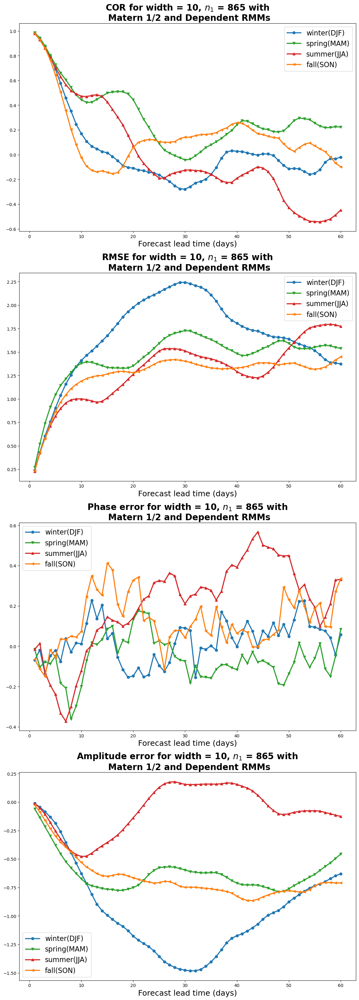

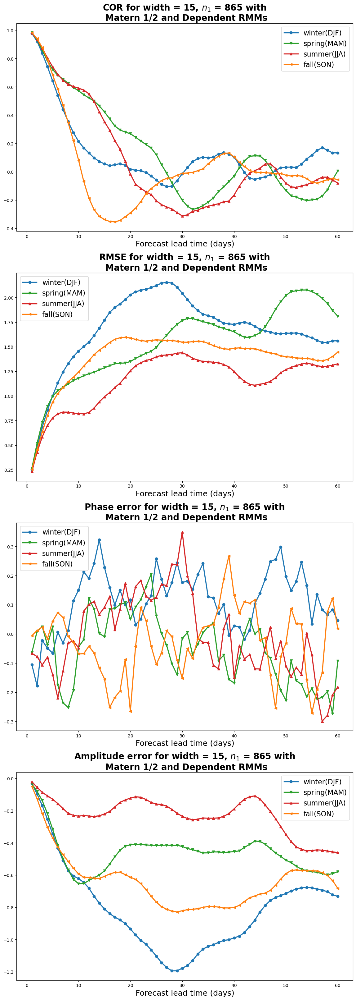

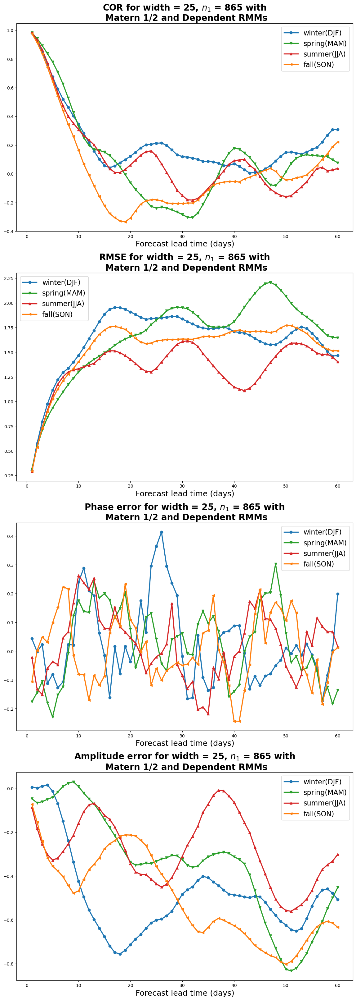

In [11]:
load_file = open('../data/preds/season/matern12_depend.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Matern 1/2 and Dependent RMMs', fontsize=20, fontweight="bold")

## $w_1$ $Mat\acute{e}rn$ $1/2$ + $w_2$ $Mat\acute{e}rn$ $3/2$ + $w_3$ $Mat\acute{e}rn$ $5/2$

### Independent RMMs

In [12]:
from IPython.display import display, Markdown
from gp_mjo.kernels.additive_matern import MaternAdditiveKernel
kernel = MaternAdditiveKernel(lengthscale_unique = False)

# Independent
dics_total_additivematern = {}
cor_total_additivematern = {}
rmse_total_additivematern = {}
phase_err_total_additivematern = {}
amplitude_err_total_additivematern = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscales", "weights"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_additivematern[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            for data_name in ['RMM1','RMM2']:
                mjo_model.train_mjo(data_name=data_name, season=True)
                mjo_model.pred_mjo(data_name=data_name, lead_time=lead_time, n_pred=n_pred,season=True)
                weights = mjo_model.model.covar_module.base_kernel.weights.detach().numpy() / mjo_model.model.covar_module.base_kernel.weights.detach().numpy().sum()
                t.add_rows( [[f'{season}', f'{width}', f'{data_name}', 
                              f'{mjo_model.model.covar_module.base_kernel.lengthscales.detach().numpy()}',
                              f'{weights}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_additivematern[season] = cor_n1
    rmse_total_additivematern[season] = rmse_n1
    phase_err_total_additivematern[season] = phase_err_n1
    amplitude_err_total_additivematern[season] = amplitude_err_n1

maternsum_independ = {'cor': cor_total_additivematern, 'rmse': rmse_total_additivematern, 
                     'phase': phase_err_total_additivematern, 'amplitude': amplitude_err_total_additivematern,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/maternsum_independ.pkl','wb')
pickle.dump(maternsum_independ, dic_pkl)

display(Markdown(rf'$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 with independent RMMs:'))
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:


$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 with independent RMMs:

+--------+-------+------+---------------------------------------+------------------------------------------------+
| season | width | RMMs |              lengthscales             |                    weights                     |
+--------+-------+------+---------------------------------------+------------------------------------------------+
| winter |   10  | RMM1 |    [2.6469994 4.5825214 6.120014 ]    |       [0.00792845 0.00420664 0.9878649 ]       |
| winter |   10  | RMM2 |      [6.622688 8.29987  9.80595 ]     |    [7.974992e-05 5.808350e-05 9.998622e-01]    |
| winter |   15  | RMM1 | [ 0.92063355 11.869011   14.458098  ] |  [2.4602455e-03 1.5786910e-06 9.9753821e-01]   |
| winter |   15  | RMM2 |    [ 2.940417 12.620275 14.221144]    |  [2.0248398e-04 2.5727024e-07 9.9979728e-01]   |
| winter |   25  | RMM1 |   [ 2.0061612 13.280985  16.934397 ]  |  [5.1662219e-03 5.3467073e-07 9.9483317e-01]   |
| winter |   25  | RMM2 |   [ 2.2929177 14.825424  19.114798 ]  |  [8.8893827e-0

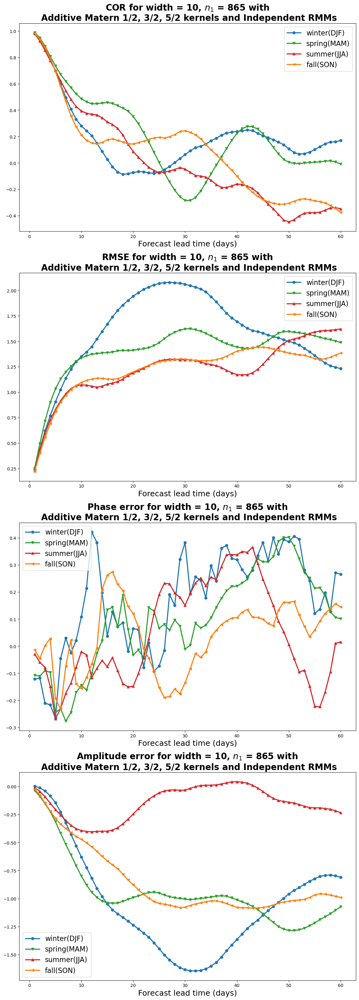

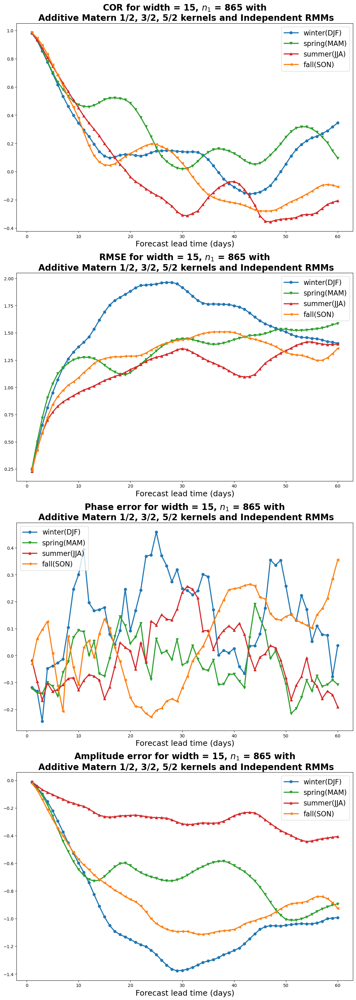

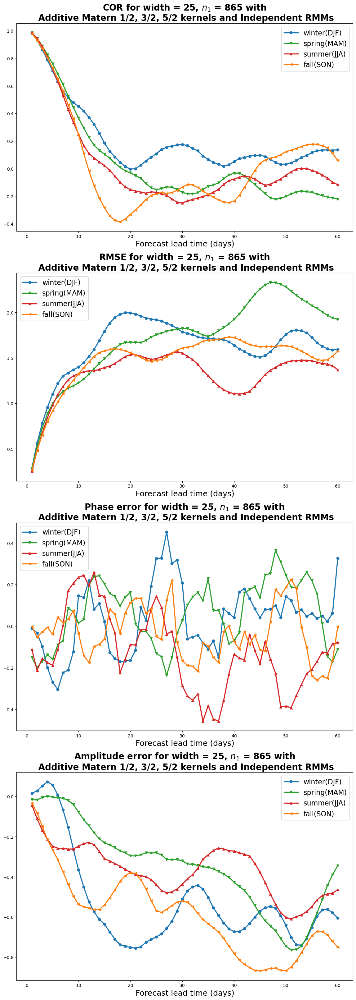

In [13]:
load_file = open('../data/preds/season/maternsum_independ.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())


# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Additive Matern 1/2, 3/2, 5/2 kernels and Independent RMMs', fontsize=20, fontweight="bold")

### Dependent RMMs

In [14]:
from IPython.display import display, Markdown
from gp_mjo.kernels.additive_matern import MaternAdditiveKernel
kernel = MaternAdditiveKernel(lengthscale_unique = False)

# Independent
dics_total_dependadditivematern = {}
cor_total_dependadditivematern = {}
rmse_total_dependadditivematern = {}
phase_err_total_dependadditivematern = {}
amplitude_err_total_dependadditivematern = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscales", "weights"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_dependadditivematern[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            mjo_model.train_mjo(Depend=True)
            for data_name in ['RMM1','RMM2']:
                mjo_model.pred_mjo(data_name, lead_time, n_pred)
            weights = mjo_model.model.covar_module.base_kernel.weights.detach().numpy() / mjo_model.model.covar_module.base_kernel.weights.detach().numpy().sum()
            t.add_rows( [[f'{season}', f'{width}', 'dependent', 
                              f'{mjo_model.model.covar_module.base_kernel.lengthscales.detach().numpy()}',
                              f'{weights}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_dependadditivematern[season] = cor_n1
    rmse_total_dependadditivematern[season] = rmse_n1
    phase_err_total_dependadditivematern[season] = phase_err_n1
    amplitude_err_total_dependadditivematern[season] = amplitude_err_n1

maternsum_depend = {'cor': cor_total_dependadditivematern, 'rmse': rmse_total_dependadditivematern, 
                     'phase': phase_err_total_dependadditivematern, 'amplitude': amplitude_err_total_dependadditivematern,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/maternsum_depend.pkl','wb')
pickle.dump(maternsum_depend, dic_pkl)

display(Markdown(rf'$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 with dependent RMMs:'))
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:


$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 with dependent RMMs:

+--------+-------+-----------+---------------------------------------+---------------------------------------------+
| season | width |    RMMs   |              lengthscales             |                   weights                   |
+--------+-------+-----------+---------------------------------------+---------------------------------------------+
| winter |   10  | dependent |    [2.4472523 4.169623  6.0250797]    |      [0.01001823 0.00280978 0.987172  ]     |
| winter |   15  | dependent |   [ 5.0417995  8.129007  16.537731 ]  | [3.6638786e-04 1.8089289e-05 9.9961549e-01] |
| winter |   25  | dependent | [ 0.89050233 11.923037   23.988611  ] | [2.8993231e-03 1.2876376e-07 9.9710047e-01] |
| spring |   10  | dependent |   [ 4.056855   7.0096116 14.153961 ]  | [1.4988110e-04 9.7788824e-03 9.9007124e-01] |
| spring |   15  | dependent |   [ 1.8886425 11.004096  17.868412 ]  | [4.6729733e-04 2.8671030e-04 9.9924594e-01] |
| spring |   25  | dependent |   [ 0.7291992 15.2375555 24.21691

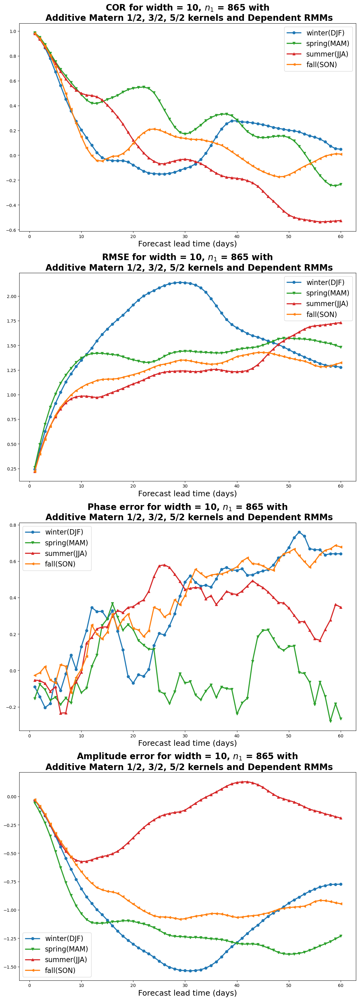

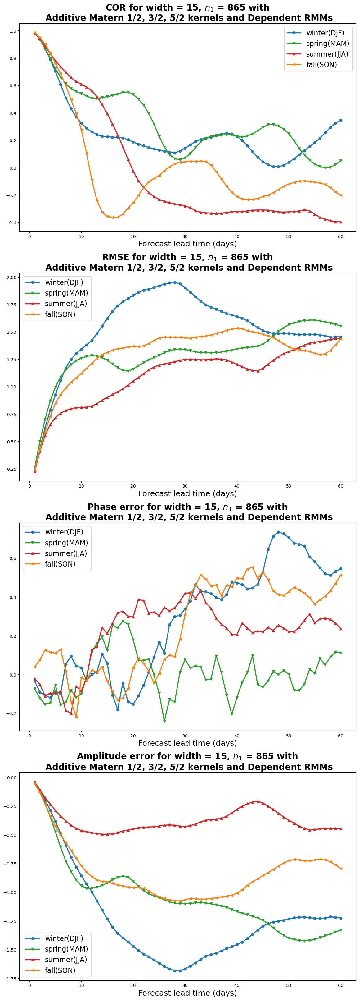

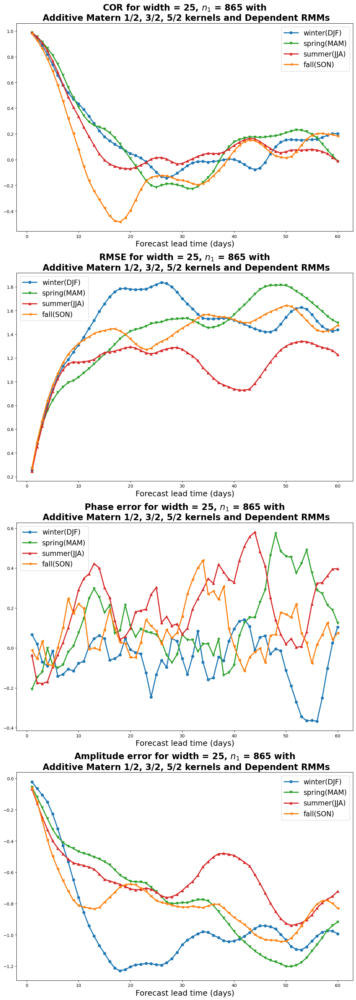

In [15]:
load_file = open('../data/preds/season/maternsum_depend.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Additive Matern 1/2, 3/2, 5/2 kernels and Dependent RMMs', fontsize=20, fontweight="bold")

## $w_1$ $Mat\acute{e}rn$ $1/2$ + $w_2$ $Mat\acute{e}rn$ $3/2$ + $w_3$ $Mat\acute{e}rn$ $5/2$ + $w_4$ Periodic

### Independent RMMs

In [16]:
from IPython.display import display, Markdown
from gp_mjo.kernels.additive_matern_period import CustomAdditiveKernel
kernel = CustomAdditiveKernel(lengthscale_unique = False)

# Independent
dics_total_additiveperiod = {}
cor_total_additiveperiod = {}
rmse_total_additiveperiod = {}
phase_err_total_additiveperiod = {}
amplitude_err_total_additiveperiod = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscales", "weights"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_additiveperiod[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            for data_name in ['RMM1','RMM2']:
                mjo_model.train_mjo(data_name=data_name, season=True)
                mjo_model.pred_mjo(data_name=data_name, lead_time=lead_time, n_pred=n_pred, season=True)
                
                weights = mjo_model.model.covar_module.base_kernel.weights.detach().numpy() / mjo_model.model.covar_module.base_kernel.weights.detach().numpy().sum()
                t.add_rows( [[f'{season}', f'{width}', f'{data_name}', 
                              f'{mjo_model.model.covar_module.base_kernel.lengthscales.detach().numpy()}',
                              f'{weights}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_additiveperiod[season] = cor_n1
    rmse_total_additiveperiod[season] = rmse_n1
    phase_err_total_additiveperiod[season] = phase_err_n1
    amplitude_err_total_additiveperiod[season] = amplitude_err_n1

periodsum_independ = {'cor': cor_total_additiveperiod, 'rmse': rmse_total_additiveperiod, 
                     'phase': phase_err_total_additiveperiod, 'amplitude': amplitude_err_total_additiveperiod,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/periodsum_independ.pkl','wb')
pickle.dump(periodsum_independ, dic_pkl)

display(Markdown(rf'$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 + $w_4$ Periodic with independent RMMs:'))
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:


$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 + $w_4$ Periodic with independent RMMs:

+--------+-------+------+-----------------------------------------------+---------------------------------------------------------------+
| season | width | RMMs |                  lengthscales                 |                            weights                            |
+--------+-------+------+-----------------------------------------------+---------------------------------------------------------------+
| winter |   10  | RMM1 |   [3.5608275 6.247053  5.7033677 5.8120804]   |         [0.01362349 0.4725704  0.50867707 0.00512906]         |
| winter |   10  | RMM2 |   [ 8.070734 10.975321 10.639576  8.978537]   |   [1.5314844e-04 8.2844254e-03 9.9146694e-01 9.5405412e-05]   |
| winter |   15  | RMM1 | [ 2.8115082 13.014214  13.919434  11.86527  ] |   [4.5401836e-03 1.2683387e-04 9.9533242e-01 5.7630717e-07]   |
| winter |   15  | RMM2 | [ 5.4929295 13.774902  13.39186   11.920097 ] |   [2.9186220e-04 1.0312809e-05 9.9969763e-01 6.4658728e-08]   |
| winter |   25  | RMM1 | [ 1.9782

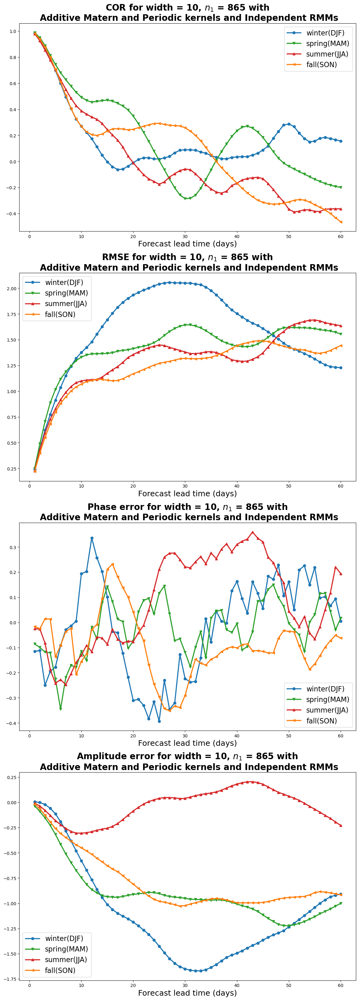

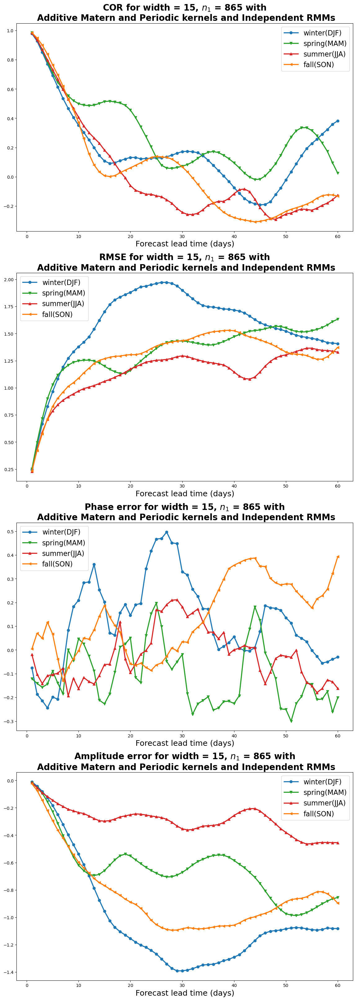

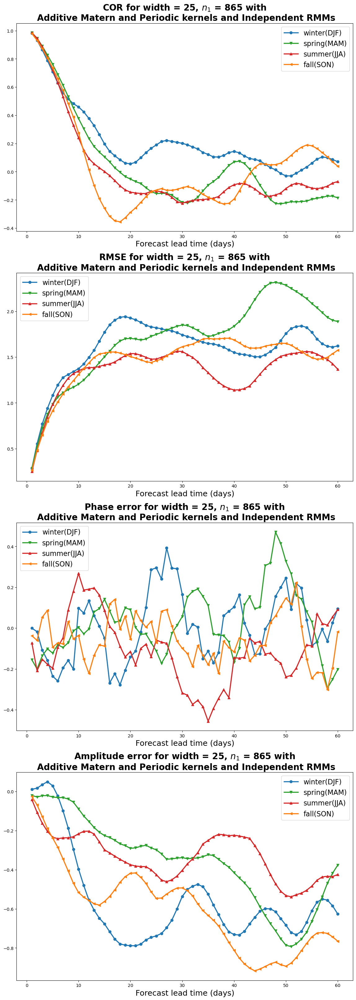

In [17]:
load_file = open('../data/preds/season/periodsum_independ.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())


# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Additive Matern and Periodic kernels and Independent RMMs', fontsize=20, fontweight="bold")

### Dependent RMMs

In [24]:
from IPython.display import display, Markdown
from gp_mjo.kernels.additive_matern_period import CustomAdditiveKernel
kernel = CustomAdditiveKernel(lengthscale_unique = False)

# Dependent
dics_total_dependadditiveperiod = {}
cor_total_dependadditiveperiod = {}
rmse_total_dependadditiveperiod = {}
phase_err_total_dependadditiveperiod = {}
amplitude_err_total_dependadditiveperiod = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscales", "weights"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_dependadditiveperiod[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            mjo_model.train_mjo(Depend=True,season=True)
            for data_name in ['RMM1','RMM2']:
                mjo_model.pred_mjo(data_name=data_name, lead_time=lead_time, n_pred=n_pred, season=True)
            weights = mjo_model.model.covar_module.base_kernel.weights.detach().numpy() / mjo_model.model.covar_module.base_kernel.weights.detach().numpy().sum()
            t.add_rows( [[f'{season}', f'{width}', 'dependent', 
                          f'{mjo_model.model.covar_module.base_kernel.lengthscales.detach().numpy()}', 
                          f'{weights}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_dependadditiveperiod[season] = cor_n1
    rmse_total_dependadditiveperiod[season] = rmse_n1
    phase_err_total_dependadditiveperiod[season] = phase_err_n1
    amplitude_err_total_dependadditiveperiod[season] = amplitude_err_n1

periodsum_depend = {'cor': cor_total_dependadditiveperiod, 'rmse': rmse_total_dependadditiveperiod, 
                     'phase': phase_err_total_dependadditiveperiod, 'amplitude': amplitude_err_total_dependadditiveperiod,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/periodsum_depend.pkl','wb')
pickle.dump(periodsum_depend, dic_pkl)

display(Markdown(rf'$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 + $w_4$ Periodic with dependent RMMs:'))
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:


$w_1$ Matern 1/2 + $w_2$ Matern 3/2 + $w_3$ Matern 5/2 + $w_4$ Periodic with dependent RMMs:

+--------+-------+-----------+-----------------------------------------------+-----------------------------------------------------------+
| season | width |    RMMs   |                  lengthscales                 |                          weights                          |
+--------+-------+-----------+-----------------------------------------------+-----------------------------------------------------------+
| winter |   10  | dependent |   [3.437462  6.877536  5.983668  1.1468738]   |       [0.0020249  0.46847185 0.52256984 0.00693335]       |
| winter |   15  | dependent | [ 8.414494  12.780533  21.037714   0.8960005] | [7.7763125e-06 5.7265547e-04 9.9904239e-01 3.7715453e-04] |
| winter |   25  | dependent | [12.13201   16.353144  23.495451   1.1163192] | [7.8054967e-08 2.4884102e-05 9.9754065e-01 2.4343056e-03] |
| spring |   10  | dependent | [12.889741  14.355255  15.795132   4.6681857] | [2.8549569e-09 3.4464692e-04 9.9964249e-01 1.2829757e-05] |
| spring |   15  | dependen

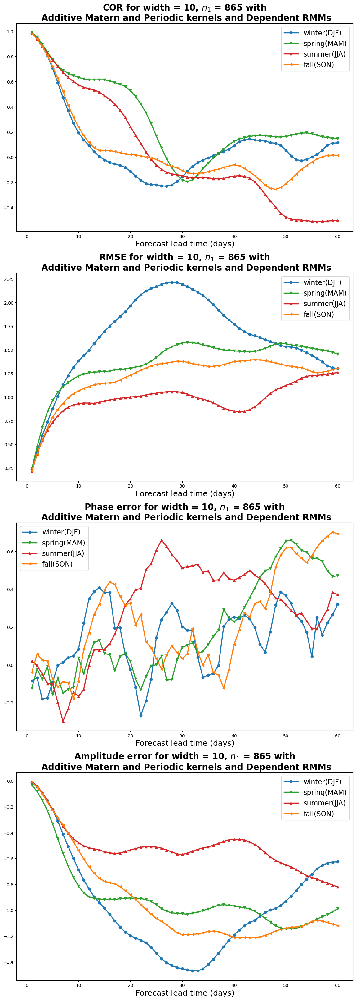

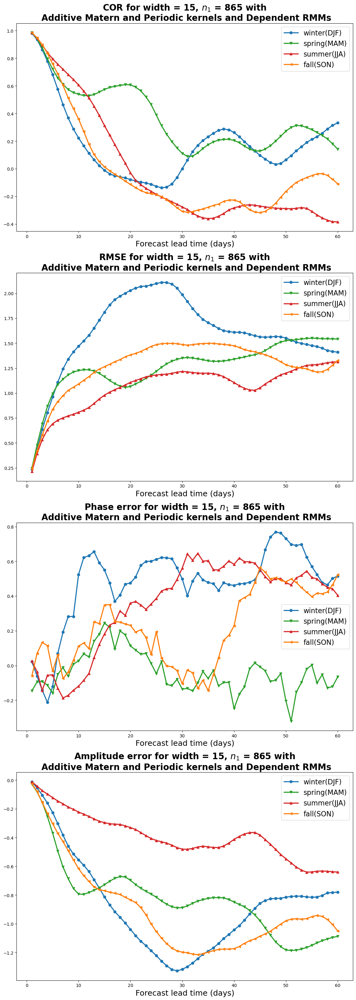

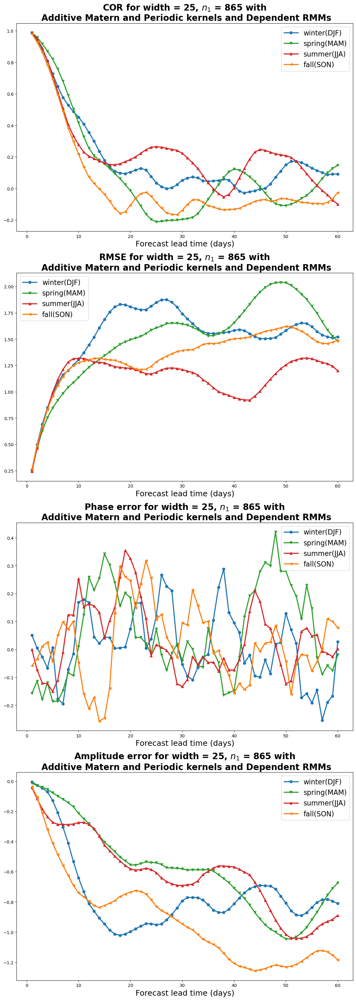

In [25]:
load_file = open('../data/preds/season/periodsum_depend.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Additive Matern and Periodic kernels and Dependent RMMs', fontsize=20, fontweight="bold")

## Block Kernels for Dependent RMMs

### $Mat\acute{e}rn$ $1/2$

In [18]:
from IPython.display import display, Markdown
from gp_mjo.kernels.block_kernel import CustomBlockKernel
nu =0.5
kernel = CustomBlockKernel(nu=nu, num_paras = 1, para_lower=1e-10, para_upper=2.0)

# Dependent
dics_total_maternblock = {}
cor_total_maternblock = {}
rmse_total_maternblock = {}
phase_err_total_maternblock = {}
amplitude_err_total_maternblock = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscale", "parameter"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_maternblock[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            mjo_model.train_mjo(Depend=True, season=True)
            mjo_model.pred_mjo(lead_time=lead_time, n_pred=n_pred, Depend=True, season=True)
            t.add_rows( [[f'{season}', f'{width}', 'dependent', 
                          f'{mjo_model.model.covar_module.base_kernel.lengthscale.detach().numpy()[0]}', 
                          f'{mjo_model.model.covar_module.base_kernel.paras.detach().numpy()}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_maternblock[season] = cor_n1
    rmse_total_maternblock[season] = rmse_n1
    phase_err_total_maternblock[season] = phase_err_n1
    amplitude_err_total_maternblock[season] = amplitude_err_n1

matern12block = {'cor': cor_total_maternblock, 'rmse': rmse_total_maternblock, 
                     'phase': phase_err_total_maternblock, 'amplitude': amplitude_err_total_maternblock,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/matern12block.pkl','wb')
pickle.dump(matern12block, dic_pkl)

display(Markdown(rf'Block Matern {nu} kernel with dependent RMMs:'))
print(t)

train and test for the season = winter:
train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:


Block Matern 0.5 kernel with dependent RMMs:

+--------+-------+-----------+-------------+-----------------+
| season | width |    RMMs   | lengthscale |    parameter    |
+--------+-------+-----------+-------------+-----------------+
| winter |   10  | dependent | [6.1489615] |   [0.0107422]   |
| winter |   15  | dependent | [16.855814] | [4.0276842e-05] |
| winter |   25  | dependent | [31.503937] | [1.9854893e-07] |
| spring |   10  | dependent |  [38.68083] | [2.2063884e-09] |
| spring |   15  | dependent |  [46.62282] | [1.0143222e-09] |
| spring |   25  | dependent |  [56.39982] |  [7.678896e-10] |
| summer |   10  | dependent | [57.315723] |  [6.832363e-10] |
| summer |   15  | dependent | [59.686966] | [6.4243033e-10] |
| summer |   25  | dependent | [65.370544] |  [6.106247e-10] |
|  fall  |   10  | dependent |  [65.02436] |  [5.154819e-10] |
|  fall  |   15  | dependent |  [66.28094] | [4.6264007e-10] |
|  fall  |   25  | dependent |  [70.69644] |  [4.189039e-10] |
+--------+-------+-----------+-------------+-----------

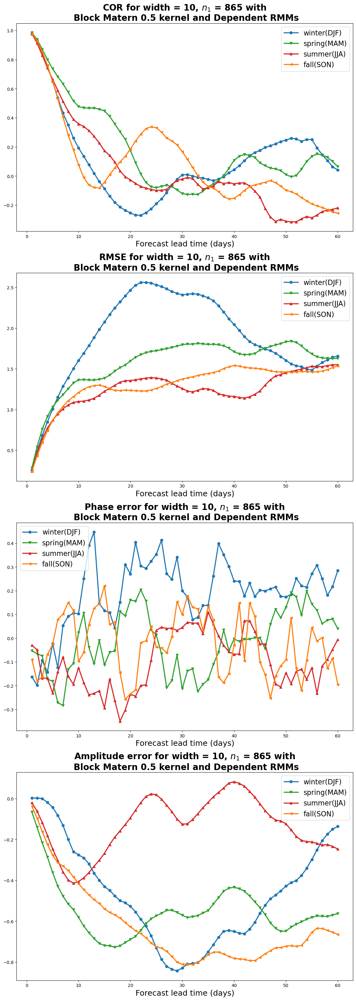

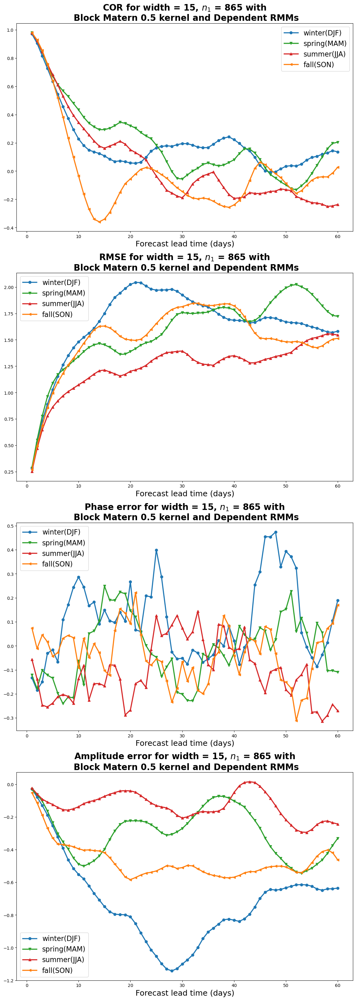

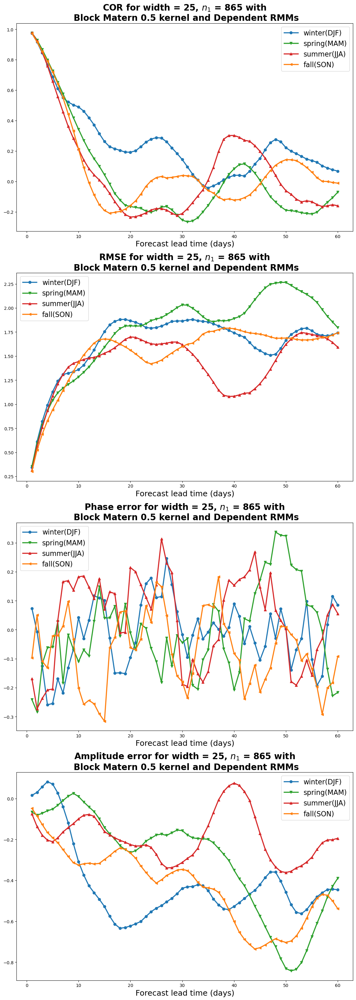

In [19]:
load_file = open('../data/preds/season/matern12block.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Block Matern {nu} kernel and Dependent RMMs', fontsize=20, fontweight="bold")

### $Mat\acute{e}rn$ $3/2$

In [20]:
from IPython.display import display, Markdown
from gp_mjo.kernels.block_kernel import CustomBlockKernel
nu = 1.5
kernel = CustomBlockKernel(nu=nu, num_paras = 1, para_lower=1e-10, para_upper=2.0)

# Dependent
dics_total_maternblock = {}
cor_total_maternblock = {}
rmse_total_maternblock = {}
phase_err_total_maternblock = {}
amplitude_err_total_maternblock = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscale", "parameter"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_maternblock[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            mjo_model.train_mjo(Depend=True, season=True)
            mjo_model.pred_mjo(lead_time=lead_time, n_pred=n_pred, Depend=True, season=True)
            t.add_rows( [[f'{season}', f'{width}', 'dependent', 
                          f'{mjo_model.model.covar_module.base_kernel.lengthscale.detach().numpy()[0]}', 
                          f'{mjo_model.model.covar_module.base_kernel.paras.detach().numpy()}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_maternblock[season] = cor_n1
    rmse_total_maternblock[season] = rmse_n1
    phase_err_total_maternblock[season] = phase_err_n1
    amplitude_err_total_maternblock[season] = amplitude_err_n1

matern32block = {'cor': cor_total_maternblock, 'rmse': rmse_total_maternblock, 
                     'phase': phase_err_total_maternblock, 'amplitude': amplitude_err_total_maternblock,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/matern32block.pkl','wb')
pickle.dump(matern32block, dic_pkl)

display(Markdown(rf'Block Matern {nu} kernel with dependent RMMs:'))
print(t)

train and test for the season = winter:


/Users/hchen/opt/anaconda3/envs/ml/lib/python3.10/site-packages/linear_operator/utils/linear_cg.py:337: NumericalWarning: CG terminated in 1000 iterations with average residual norm 0.12633167207241058 which is larger than the tolerance of 0.01 specified by linear_operator.settings.cg_tolerance. If performance is affected, consider raising the maximum number of CG iterations by running code in a linear_operator.settings.max_cg_iterations(value) context.
  warnings.warn(


train and test for the season = spring:
train and test for the season = summer:
train and test for the season = fall:


Block Matern 1.5 kernel with dependent RMMs:

+--------+-------+-----------+-------------+------------------+
| season | width |    RMMs   | lengthscale |    parameter     |
+--------+-------+-----------+-------------+------------------+
| winter |   10  | dependent | [4.4582257] |   [0.00830142]   |
| winter |   15  | dependent | [13.869143] | [1.5911979e-05]  |
| winter |   25  | dependent | [17.272419] | [1.02455196e-07] |
| spring |   10  | dependent | [18.429924] |  [1.247585e-09]  |
| spring |   15  | dependent | [17.941055] |  [6.42299e-10]   |
| spring |   25  | dependent | [17.586096] |  [5.216064e-10]  |
| summer |   10  | dependent | [17.059795] |  [4.660298e-10]  |
| summer |   15  | dependent | [20.147013] | [4.3250822e-10]  |
| summer |   25  | dependent | [14.368188] |  [4.139891e-10]  |
|  fall  |   10  | dependent | [18.495275] | [3.5886483e-10]  |
|  fall  |   15  | dependent | [20.570152] | [3.2134703e-10]  |
|  fall  |   25  | dependent | [15.702354] | [3.0152378e-10]  |
+--------+-------+-----------+----------

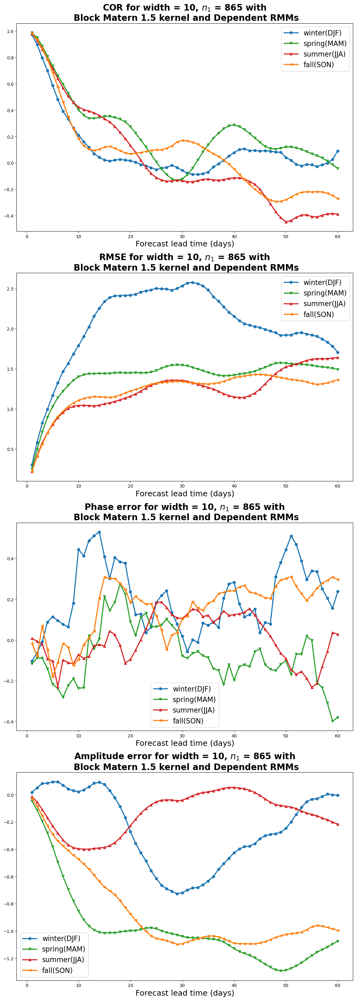

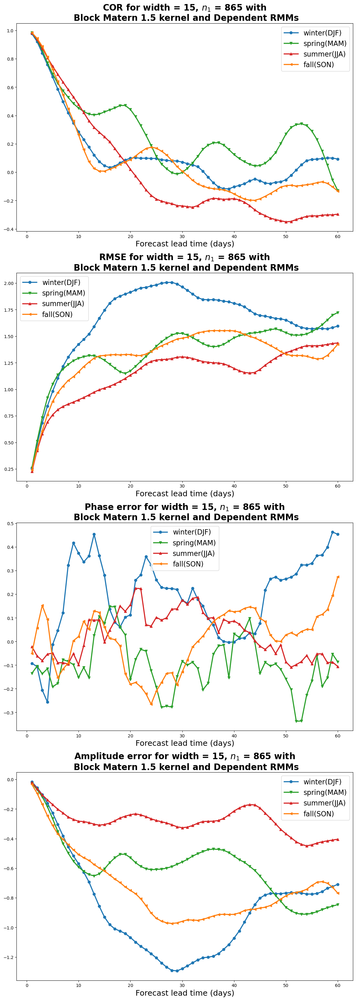

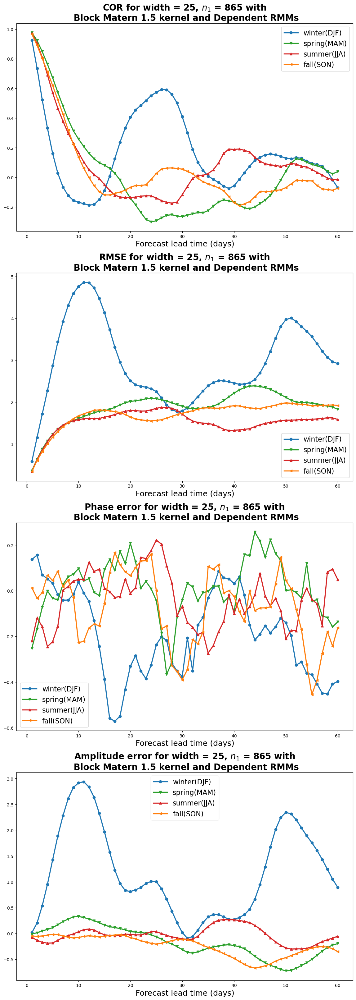

In [21]:
load_file = open('../data/preds/season/matern32block.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Block Matern {nu} kernel and Dependent RMMs', fontsize=20, fontweight="bold")

### $Mat\acute{e}rn$ $5/2$

In [22]:
from IPython.display import display, Markdown
from gp_mjo.kernels.block_kernel import CustomBlockKernel
nu = 2.5
kernel = CustomBlockKernel(nu=nu, num_paras = 1, para_lower=1e-10, para_upper=1.5)

# Dependent
dics_total_maternblock = {}
cor_total_maternblock = {}
rmse_total_maternblock = {}
phase_err_total_maternblock = {}
amplitude_err_total_maternblock = {}

t = PrettyTable(["season", "width", "RMMs", "lengthscale", "parameter"])

for m, season in zip(ms,seasons):

    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + f'train and test for the season = {season}:' + Style.RESET_ALL)
    print(Back.RED + Fore.WHITE + Style.BRIGHT + '=======================================' + Style.RESET_ALL)

    cor_n1 = {}
    rmse_n1 = {}
    phase_err_n1 = {}
    amplitude_err_n1 = {}
    for n1 in n1s:
        dics, dics_ids = dics_divide(season_datas[season], data_names, n1, m, n, c)
        dics_total_maternblock[n1] = dics

        cor_width = {}
        rmse_width = {}
        phase_err_width = {}
        amplitude_err_width = {}
        for width in widths:
            mjo_model = gp_mjo(dics, dics_ids, kernel, width, n_iter, sigma_eps,fixed_noise)
            mjo_model.train_mjo(Depend=True, season=True)
            mjo_model.pred_mjo(lead_time=lead_time, n_pred=n_pred, Depend=True, season=True)
            t.add_rows( [[f'{season}', f'{width}', 'dependent', 
                          f'{mjo_model.model.covar_module.base_kernel.lengthscale.detach().numpy()[0]}', 
                          f'{mjo_model.model.covar_module.base_kernel.paras.detach().numpy()}']] )

            # compute errors
            cor_width[width] = mjo_model.cor()
            rmse_width[width] = mjo_model.rmse()
            phase_err_width[width] = mjo_model.phase_err()
            amplitude_err_width[width] = mjo_model.amplitude_err()
            
        cor_n1[n1] = cor_width
        rmse_n1[n1] = rmse_width
        phase_err_n1[n1] = phase_err_width
        amplitude_err_n1[n1] = amplitude_err_width
    
    cor_total_maternblock[season] = cor_n1
    rmse_total_maternblock[season] = rmse_n1
    phase_err_total_maternblock[season] = phase_err_n1
    amplitude_err_total_maternblock[season] = amplitude_err_n1

matern52block = {'cor': cor_total_maternblock, 'rmse': rmse_total_maternblock, 
                     'phase': phase_err_total_maternblock, 'amplitude': amplitude_err_total_maternblock,
                     'paras': t.get_string()}
dic_pkl = open('../data/preds/season/matern52block.pkl','wb')
pickle.dump(matern52block, dic_pkl)

display(Markdown(rf'Block Matern {nu} kernel with dependent RMMs:'))
print(t)

train and test for the season = winter:
train and test for the season = spring:


/Users/hchen/opt/anaconda3/envs/ml/lib/python3.10/site-packages/linear_operator/utils/linear_cg.py:337: NumericalWarning: CG terminated in 1000 iterations with average residual norm 0.028342708945274353 which is larger than the tolerance of 0.01 specified by linear_operator.settings.cg_tolerance. If performance is affected, consider raising the maximum number of CG iterations by running code in a linear_operator.settings.max_cg_iterations(value) context.
  warnings.warn(


train and test for the season = summer:
train and test for the season = fall:


Block Matern 2.5 kernel with dependent RMMs:

+--------+-------+-----------+-------------+------------------+
| season | width |    RMMs   | lengthscale |    parameter     |
+--------+-------+-----------+-------------+------------------+
| winter |   10  | dependent | [2.9225402] |   [0.00649284]   |
| winter |   15  | dependent |  [8.167736] | [1.16830615e-05] |
| winter |   25  | dependent | [11.941608] | [3.7888537e-08]  |
| spring |   10  | dependent | [14.186908] |  [1.089374e-09]  |
| spring |   15  | dependent |  [5.806227] |  [6.75784e-10]   |
| spring |   25  | dependent | [11.306383] |  [5.143026e-10]  |
| summer |   10  | dependent | [13.704322] | [4.6081847e-10]  |
| summer |   15  | dependent | [16.477182] | [4.2590204e-10]  |
| summer |   25  | dependent |  [9.87475]  | [4.0877096e-10]  |
|  fall  |   10  | dependent | [15.130311] |  [3.53655e-10]   |
|  fall  |   15  | dependent | [16.869156] | [3.1550962e-10]  |
|  fall  |   25  | dependent | [10.638486] | [2.9177222e-10]  |
+--------+-------+-----------+----------

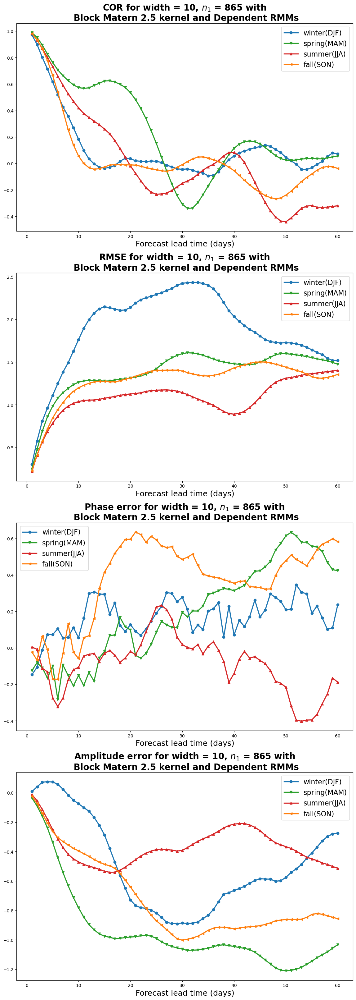

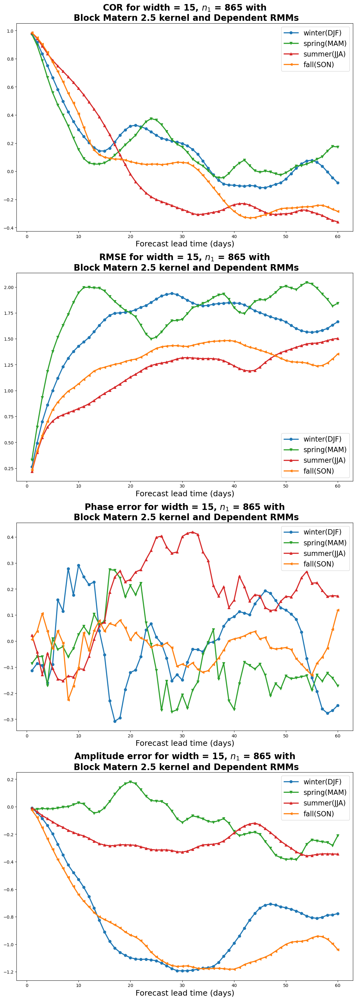

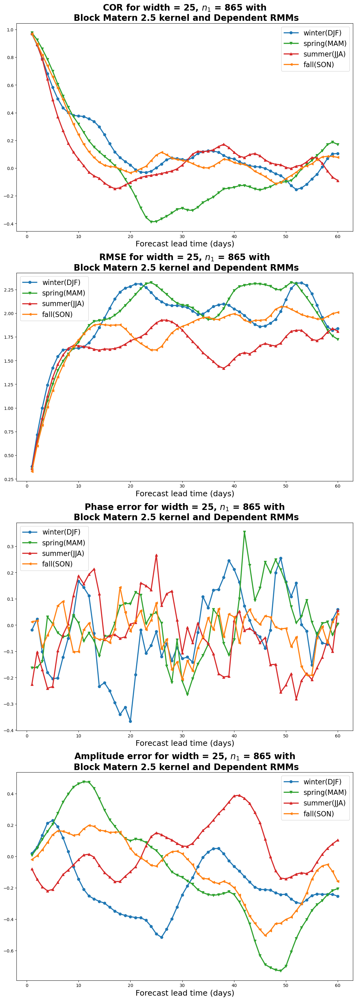

In [23]:
load_file = open('../data/preds/season/matern52block.pkl', 'rb')
dic_file = pickle.load(load_file)
seasons = list(dic_file['cor'].keys())
n1s = list(dic_file['cor']['winter'].keys())
widths = list(dic_file['cor']['winter'][n1s[0]].keys())

# Plot
palette_colors = list(mcolors.TABLEAU_COLORS.keys()) # list of Tableau Palette colors
#plot_colors = palette_colors[:len(seasons)]
plot_colors = ['tab:blue','tab:green','tab:red','tab:orange']
markers_class = list(MarkerStyle.markers.keys())
plot_markers = markers_class[2:2+len(seasons)]

season_months = ['winter(DJF)','spring(MAM)','summer(JJA)','fall(SON)']
mjo_errs = ['COR', 'RMSE', 'Phase error', 'Amplitude error']

for n1 in n1s:
    for width in widths:
        fig, axs = plt.subplots(4, 1, figsize=(14, 10*4))
        for season, color, marker in zip(seasons, plot_colors, plot_markers):
            _cor = dic_file['cor'][season][n1][width]
            _rmse = dic_file['rmse'][season][n1][width]
            _phase_err = dic_file['phase'][season][n1][width]
            _amplitude_err = dic_file['amplitude'][season][n1][width]
            
            
            axs[0].plot(np.arange(1,lead_time+1), _cor, color=color, linewidth=2.5, marker=marker)
            axs[1].plot(np.arange(1,lead_time+1), _rmse, color=color, linewidth=2.5, marker=marker)
            axs[2].plot(np.arange(1,lead_time+1), _phase_err, color=color, linewidth=2.5, marker=marker)
            axs[3].plot(np.arange(1,lead_time+1), _amplitude_err, color=color, linewidth=2.5, marker=marker)

        for i, mjo_err in enumerate(mjo_errs):
            axs[i].set_xlabel('Forecast lead time (days)', fontsize=18)
            axs[i].legend(season_months, fontsize=16)
            axs[i].set_title(f'{mjo_err} for width = {width}, $n_1$ = {n1} with \n Block Matern {nu} kernel and Dependent RMMs', fontsize=20, fontweight="bold")